# Mel-frequency cepstral coefficients (MFCC) pipeline

In [15]:
%matplotlib inline

import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

print(torch.__version__)
print(torchaudio.__version__)

import librosa
import matplotlib.pyplot as plt

from IPython.display import Audio
from torchaudio.utils import download_asset

torch.random.manual_seed(0)

def plot_waveform(waveform, sr, title="Waveform"):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sr

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes.plot(time_axis, waveform[0], linewidth=1)
        axes.grid(True)
    else:
        for axis in axes:
            axis.plot(time_axis, waveform[0], linewidth=1)
            axis.grid(True)
    figure.suptitle(title)

def plot_spectrogram(specgram, title=None, ylabel="freq_bin"):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or "Spectrogram (db)")
    axs.set_ylabel(ylabel)
    axs.set_xlabel("frame")
    im = axs.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto")
    fig.colorbar(im, ax=axs)

def plot_fbank(fbank, title=None):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or "Filter bank")
    axs.imshow(fbank, aspect="auto")
    axs.set_ylabel("frequency bin")
    axs.set_xlabel("mel bin")

2.0.1+cpu
2.0.2+cpu


## Obtain waveform

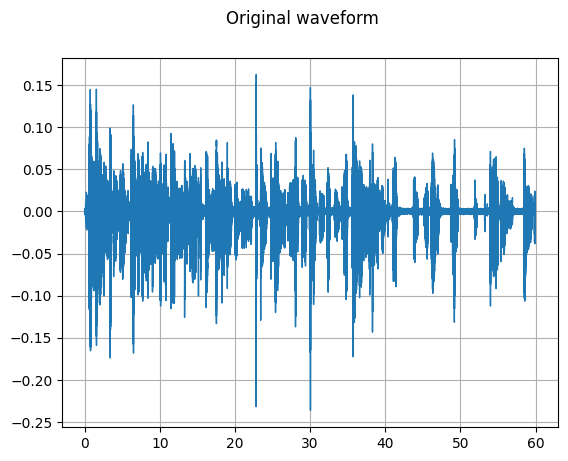

In [16]:
SAMPLE_SPEECH = "sampledata/Training/Audio/7-17-2023 4-53-18 PM.wav"

SPEECH_WAVEFORM, SAMPLE_RATE = torchaudio.load(SAMPLE_SPEECH)
SPEECH_WAVEFORM = torch.mean(SPEECH_WAVEFORM, dim=0).unsqueeze(0)

plot_waveform(SPEECH_WAVEFORM, SAMPLE_RATE, title="Original waveform")
plt.show()

In [17]:
Audio(SPEECH_WAVEFORM.numpy(), rate=SAMPLE_RATE)

## Plot spectrogram

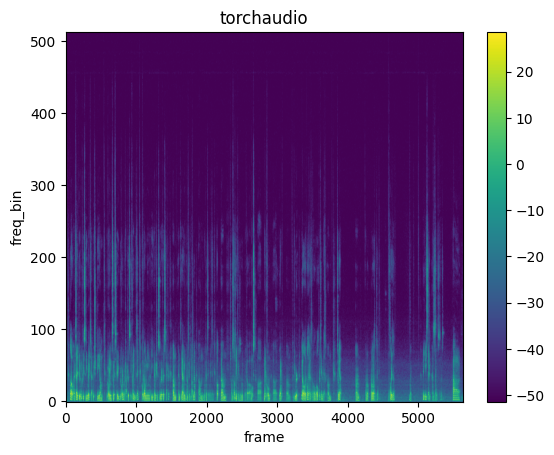

In [18]:
def spectrogram(n_fft=1024, win_length=None, hop_length=512):
    # Define transform
    return T.Spectrogram(
        n_fft=n_fft,
        win_length=win_length,
        hop_length=hop_length,
        center=True,
        pad_mode="reflect",
        power=2.0,
    )

spec = spectrogram()(SPEECH_WAVEFORM)
plot_spectrogram(spec[0], title="torchaudio")
plt.show()

## Recover waveform

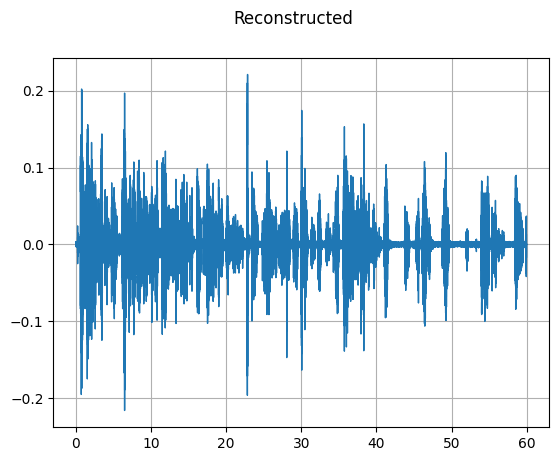

In [19]:
def recover_spectrogram(n_fft=1024, win_length=None, hop_length=512):
    return T.GriffinLim(
        n_fft=n_fft,
        win_length=win_length,
        hop_length=hop_length,
    )

reconstructed_waveform = recover_spectrogram()(spec)

plot_waveform(reconstructed_waveform, SAMPLE_RATE, title="Reconstructed")
plt.show()

In [20]:
Audio(reconstructed_waveform, rate=SAMPLE_RATE)

## Plot Mel Filter bank

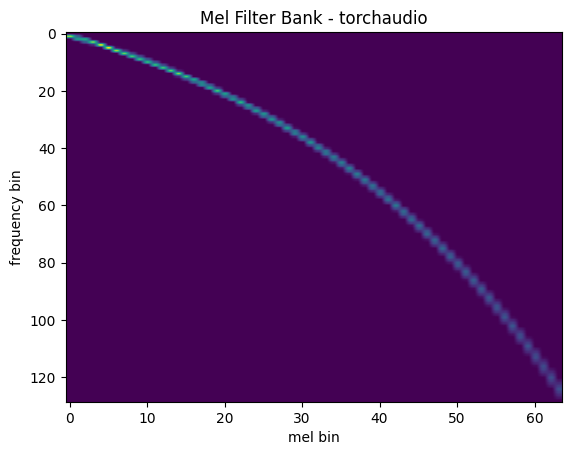

In [21]:
def mel_filters(n_fft=256, n_mels=64, sample_rate=6000):
    return F.melscale_fbanks(
        int(n_fft // 2 + 1),
        n_mels=n_mels,
        f_min=0.0,
        f_max=sample_rate / 2.0,
        sample_rate=sample_rate,
        norm="slaney",
    )

plot_fbank(mel_filters(), "Mel Filter Bank - torchaudio")
plt.show()

## Plot Mel Spectrogram

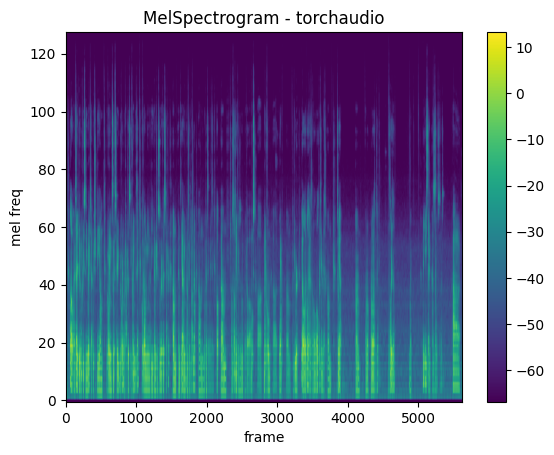

In [22]:
def mel_spectrogram(n_fft=1024, win_length=None, hop_length=512, n_mels=128):
    return T.MelSpectrogram(
        sample_rate=SAMPLE_RATE,
        n_fft=n_fft,
        win_length=win_length,
        hop_length=hop_length,
        center=True,
        pad_mode="reflect",
        power=2.0,
        norm="slaney",
        n_mels=n_mels,
        mel_scale="htk",
    )

melspec = mel_spectrogram()(SPEECH_WAVEFORM)
plot_spectrogram(melspec[0], title="MelSpectrogram - torchaudio", ylabel="mel freq")
plt.show()

## Plot MFCC

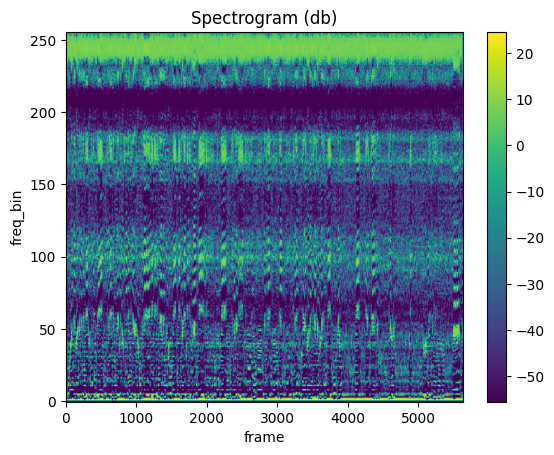

In [23]:
def mfcc_transform(n_fft=2048, win_length=None, hop_length=512, n_mels=256, n_mfcc=256):
    return T.MFCC(
        sample_rate=SAMPLE_RATE,
        n_mfcc=n_mfcc,
        melkwargs={
            "n_fft": n_fft,
            "n_mels": n_mels,
            "hop_length": hop_length,
            "mel_scale": "htk",
        },
    )

mfcc = mfcc_transform()(SPEECH_WAVEFORM)
plot_spectrogram(mfcc[0])
plt.show()

In [26]:
print(mfcc)

tensor([[[-5.0689e+02, -4.8531e+02, -4.9093e+02,  ..., -7.5123e+02,
          -7.5123e+02, -7.5123e+02],
         [ 2.8350e+01,  5.4395e+01,  6.7767e+01,  ...,  7.6667e-05,
           7.6667e-05,  7.6667e-05],
         [-1.6185e+01, -8.4969e+00, -5.7163e+00,  ..., -4.4945e-05,
          -4.4945e-05, -4.4945e-05],
         ...,
         [-1.5206e+00,  1.0429e+00,  5.7476e+00,  ..., -1.3609e-04,
          -1.3609e-04, -1.3609e-04],
         [-9.6027e-01,  3.2204e-01,  3.7107e+00,  ..., -1.5078e-03,
          -1.5078e-03, -1.5078e-03],
         [-3.8749e+00, -1.5121e+00,  2.6461e+00,  ...,  7.1926e-04,
           7.1926e-04,  7.1926e-04]]])
